In [1]:
import numpy as np
import pandas as pd
import plotly
import os
import json
import requests
import plotly.graph_objects as go

# Products

So far we have seen how some countries have changed the way they trade across the years, but what about how the way products are trade has changed? First, let's take a break and play a game. Think for a second on **healthy food**. Not difficult to guess what came to your mind: avocados! or quinoa! Everybody knows how nutritious (and delicious) avocados are. Just type avocado in google and you will find all the incredible health benefits of it. Same for quinoa: high in protein, gluten-free, the perfect substitue of rice and pasta. These are two examples of modern-day "superfoods" whose recent popularity may have changed the way they are traded, so let's analyze them deeper!

## Avocado

### You are the avocado to my toast

Since, one image is worth more than one thousand words:

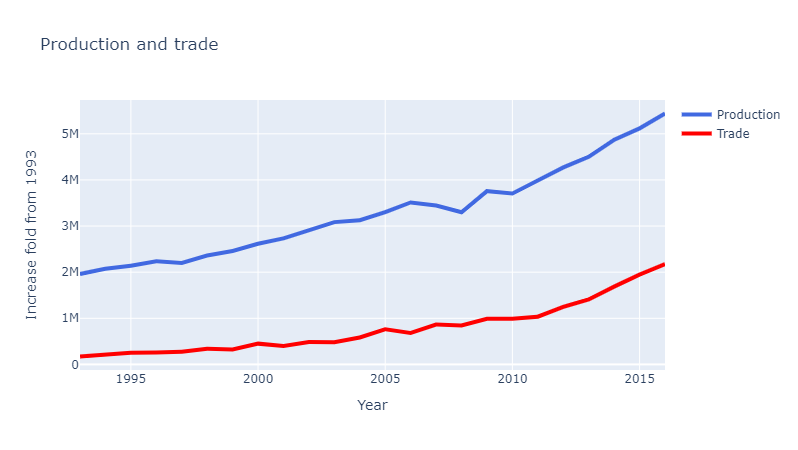

In [29]:
df_prod = pd.read_pickle("data/df_prod.pkl")
df_prod = df_prod.loc[df_prod['Element'] == 'Production']
df_prod = df_prod.loc[df_prod['Item'] == 'Avocados'].drop(['Area','Item', 'Element', 'Unit'], axis = 1).dropna()
prod = np.array(df_prod).sum(axis = 0)
prod = prod

df_trade = pd.read_pickle('data/df_trade_merged.pkl')
df_trade = df_trade.loc[df_trade['Item'] == 'Avocados']
df_trade = df_trade.drop(['Importer','Exporter', 'Item'], axis = 1).dropna()
trade = np.array(df_trade).sum(axis = 0)
trade = trade

import plotly.graph_objects as go
years = ['1993', '1994', '1995', '1996', '1997', '1998', '1999', '2000', '2001', '2002', '2003', '2004', '2005', \
'2006', '2007', '2008', '2009', '2010', '2011', '2012', '2013', '2014', '2015', '2016'] 
fig = go.Figure()
fig.add_trace(go.Scatter(x=years, y=prod, mode='lines', name='Production', line = dict(color='royalblue', width=4)))
fig.add_trace(go.Scatter(x=years, y=trade, mode='lines', name='Trade', line = dict(color='red', width=4)))
fig.update_layout(title='Production and trade',
                   xaxis_title='Year',
                   yaxis_title='Increase fold from 1993')

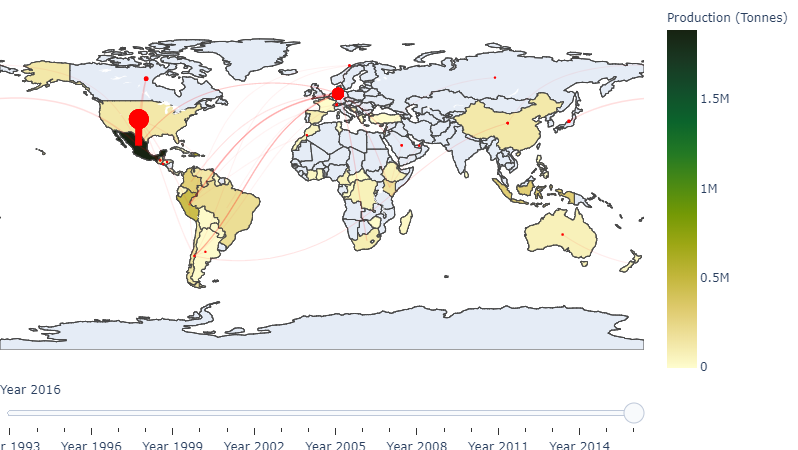

In [82]:
from GRANADASM import production_trade
# Set Europe to False if you want to see the EU countries individually
production_trade('Avocados', Europe = True, cs = 'speed', thick = 15,  th_max = 320, th_min = 2, th_max2 = 120, th_min2 = 1, op_per = 0.95)


from GRANADAS import production_trade
# Set Europe to False if you want to see the EU countries individually
production_trade('Avocados', Europe = True, cs = 'speed', thick = 15,  th_max = 320, th_min = 2, th_max2 = 120, th_min2 = 1, op_per = 0.95)


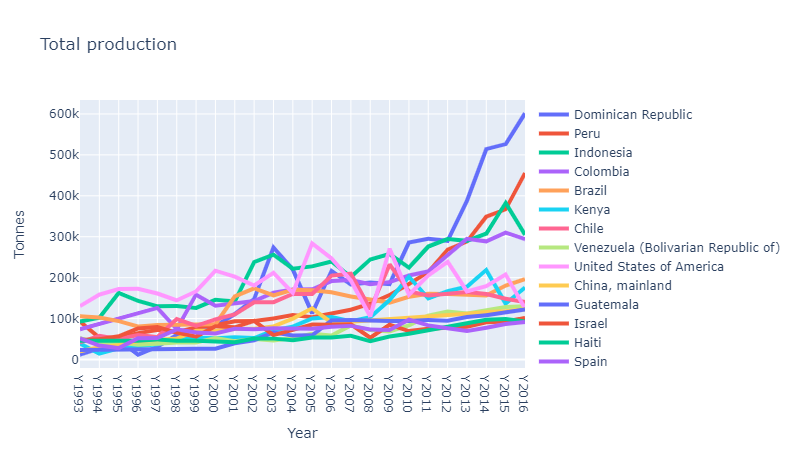

In [22]:
import plotly.graph_objects as go
years = ['Y1993', 'Y1994', 'Y1995', 'Y1996', 'Y1997', 'Y1998', 'Y1999', 'Y2000', 'Y2001', 'Y2002', 'Y2003', 'Y2004', 'Y2005', \
'Y2006', 'Y2007', 'Y2008', 'Y2009', 'Y2010', 'Y2011', 'Y2012', 'Y2013', 'Y2014', 'Y2015', 'Y2016'] 
fig = go.Figure()
country = prod_avocad['Area']
for i in range(1, 15):
    fig.add_trace(go.Scatter(x=years, y= prod_avocad.iloc[i][years], mode='lines', name=country[i], line = dict(width=4)))
fig.update_layout(title='Total production',
                   xaxis_title='Year',
                   yaxis_title='Tonnes')

### Getting numbers:

**a) Mexico-US:**

In [2]:
df_prod = pd.read_pickle("data/df_prod.pkl")
df_prod = df_prod.loc[df_prod['Element'] == 'Production']
df_prod = df_prod.loc[df_prod['Item'] == 'Avocados']

df_trade = pd.read_pickle('data/df_trade_merged.pkl')
df_trade = df_trade.loc[df_trade['Item'] == 'Avocados']

Total exports of avocados in Mexico, total exports to the US and ratio

In [13]:
# Total amount of avocados exported from Mexico
trade_16 = df_trade.loc[df_trade['Exporter'] == 'Mexico']
mexico_total_exp_16 = np.sum(trade_16['2016'])
mexico_total_exp_94 = np.sum(trade_16['1994'])
mexico_total_exp_94, mexico_total_exp_16

(41175.0, 1033664.0)

In [12]:
# Total amount of avocados exported to the US
mexico_US_exp_16 = trade_16.loc[df_trade['Importer'] == 'United States of America']['2016'].sum()
mexico_US_exp_94 = trade_16.loc[df_trade['Importer'] == 'United States of America']['1994'].sum()
mexico_US_exp_94, mexico_US_exp_16

(5751.0, 785076.0)

In [14]:
# Percentage of this avocados to the US
ratio_94 = mexico_US_exp_94/mexico_total_exp_94
ratio_16 = mexico_US_exp_16/mexico_total_exp_16
ratio_94 , ratio_16

(0.13967213114754098, 0.7595079252058696)

In [18]:
# Production of avocados in Mexico
prod_16 = df_prod.loc[df_prod['Area'] == 'Mexico']['Y2016'].sum()
prod_94 = df_prod.loc[df_prod['Area'] == 'Mexico']['Y1994'].sum()
prod_16, prod_94

(1889354.0, 799929.0)

**b) EUROPE**

In [20]:
from GRANADAS import correct_names
correct3 =  ['EU','EU','EU','EU','EU','EU','EU','EU','EU','EU','EU','EU','EU','EU','EU','EU','EU',
          'EU','EU','EU','EU','EU','EU','EU','EU','EU','EU', 'EU']
wrong3 = ['Austria', 'Belgium', 'Bulgaria', 'Croatia', 'Czechia', 'Denmark', 'Estonia', 'Finland', 'France', 'Germany',  'Greece', 'Hungary', 'Ireland', 'Italy', 'Latvia', 'Lithuania', 'Luxembourg', 'Malta', 'Netherlands', 'Poland',
     'Portugal', 'Romania', 'Slovakia',  'Slovenia', 'Spain', 'Sweden', 'United Kingdom', 'Cyprus']

In [35]:
trade_toEU = correct_names(df_trade, 'Importer', correct3, wrong3)
trade_toEU = correct_names(trade_toEU, 'Exporter', correct3, wrong3)

In [36]:
trade_toEU = trade_toEU.groupby(['Importer', 'Exporter']).sum().reset_index()

In [46]:
trade_toEU.loc[trade_toEU['Importer'] == 'EU'].sort_values(['1994'], ascending = False).head(5)

,Importer,Exporter,1993,1994,1995,1996,1997,1998,1999,2000,...,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
640,EU,EU,53870.0,55508.0,58523.0,76698.0,78657.0,96367.0,76953.0,92597.0,...,135769.0,163136.0,156879.0,188142.0,199587.0,214195.0,229493.0,255217.0,294944.0,366331.0
708,EU,South Africa,19027.0,34728.0,15875.0,10784.0,14846.0,38430.0,30300.0,56647.0,...,39952.0,55179.0,46689.0,51076.0,32829.0,53453.0,48610.0,66307.0,56429.0,60205.0
660,EU,Israel,24311.0,22013.0,30284.0,42344.0,39283.0,26792.0,39449.0,58248.0,...,69233.0,34284.0,38109.0,48188.0,44241.0,39184.0,47084.0,45485.0,44281.0,39089.0
676,EU,Mexico,13733.0,21039.0,36454.0,27698.0,19170.0,14201.0,14442.0,13802.0,...,11900.0,12377.0,10818.0,8176.0,3624.0,5945.0,9599.0,12267.0,27793.0,56566.0
665,EU,Kenya,5966.0,6745.0,8743.0,6419.0,12501.0,6945.0,9659.0,11442.0,...,11871.0,11847.0,15046.0,14136.0,15034.0,17079.0,17518.0,15605.0,20803.0,23535.0


In [47]:
trade_toEU.loc[trade_toEU['Importer'] == 'EU'].sort_values(['2016'], ascending = False).head(5)

,Importer,Exporter,1993,1994,1995,1996,1997,1998,1999,2000,...,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
640,EU,EU,53870.0,55508.0,58523.0,76698.0,78657.0,96367.0,76953.0,92597.0,...,135769.0,163136.0,156879.0,188142.0,199587.0,214195.0,229493.0,255217.0,294944.0,366331.0
690,EU,Peru,0.0,0.0,0.0,3.0,3.0,4.0,486.0,2376.0,...,42895.0,60207.0,54223.0,64837.0,80091.0,75556.0,98283.0,119324.0,128828.0,159287.0
628,EU,Chile,2905.0,31.0,12.0,23.0,2.0,26.0,4.0,50.0,...,32734.0,18721.0,46289.0,37339.0,29918.0,46118.0,58869.0,62569.0,69687.0,97402.0
708,EU,South Africa,19027.0,34728.0,15875.0,10784.0,14846.0,38430.0,30300.0,56647.0,...,39952.0,55179.0,46689.0,51076.0,32829.0,53453.0,48610.0,66307.0,56429.0,60205.0
676,EU,Mexico,13733.0,21039.0,36454.0,27698.0,19170.0,14201.0,14442.0,13802.0,...,11900.0,12377.0,10818.0,8176.0,3624.0,5945.0,9599.0,12267.0,27793.0,56566.0


In [43]:
# We remove the ones coming from Europe
total_94 = np.sum(trade_toEU['1994']) - 53870
total_16 = np.sum(trade_toEU['2016']) - 366331
total_94, total_16

(165749.0, 1809046.0)

Analyzing the Netherlands

In [70]:
df_trade.groupby(['Exporter']).sum().sort_values(['2007'], ascending = False).head(10)

,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,...,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
Exporter,,,,,,,,,,,,,,,,,,,,,
Mexico,23487.0,41175.0,68260.0,49122.0,63848.0,73235.0,67983.0,110623.0,89831.0,103384.0,...,312746.0,315463.0,391870.0,369352.0,403940.0,565010.0,654237.0,755191.0,1001018.0,1033664.0
Chile,5083.0,18774.0,11924.0,16789.0,16717.0,48226.0,37720.0,56846.0,57955.0,81221.0,...,151190.0,88413.0,172956.0,116039.0,110368.0,103268.0,98195.0,128985.0,108787.0,171249.0
Israel,25546.0,23188.0,31453.0,43696.0,40534.0,28228.0,40904.0,60022.0,52735.0,73720.0,...,73564.0,37427.0,42689.0,55447.0,53486.0,49073.0,59221.0,57298.0,54621.0,47807.0
Netherlands,6274.0,8510.0,13603.0,18392.0,16127.0,18259.0,17050.0,18211.0,19594.0,20943.0,...,55881.0,67801.0,74138.0,80420.0,88023.0,111188.0,126684.0,136293.0,153721.0,200089.0
Spain,36635.0,29882.0,25038.0,37995.0,45038.0,58012.0,41090.0,42758.0,45550.0,45141.0,...,50480.0,60142.0,53843.0,60499.0,79646.0,75586.0,78824.0,83408.0,95913.0,101146.0
Peru,77.0,0.0,0.0,3.0,3.0,4.0,594.0,2885.0,2634.0,5628.0,...,48314.0,69408.0,65078.0,76539.0,99852.0,107264.0,135808.0,209961.0,203788.0,223968.0
South Africa,19792.0,38282.0,16908.0,12042.0,17030.0,41040.0,33263.0,59027.0,35007.0,50064.0,...,43310.0,59440.0,50352.0,56649.0,37344.0,61317.0,55780.0,76290.0,65094.0,67501.0
France,7878.0,7694.0,10655.0,16399.0,15669.0,16140.0,17859.0,23346.0,19636.0,20549.0,...,30015.0,37547.0,15709.0,14963.0,16963.0,23887.0,18991.0,24974.0,26269.0,29780.0
Dominican Republic,5732.0,4607.0,6431.0,7024.0,6738.0,6313.0,9164.0,10224.0,9656.0,11758.0,...,17759.0,19393.0,16931.0,18540.0,19877.0,17158.0,19938.0,18480.0,14661.0,23715.0


In [3]:
top_exporters = df_trade.groupby(['Exporter']).sum().reset_index()
top_exporters.to_csv("TopExpAvo")
top_exporters = df_trade.groupby(['Importer']).sum().reset_index()
top_exporters.to_csv("TopImpAvo")

In [73]:
netherlands = df_trade.loc[df_trade['Exporter'] == 'Netherlands']
netherlands = netherlands.loc[netherlands['2016'] != 0]

In [83]:
netherlands.sort_values(['2016'], ascending = False).head(10)

,Importer,Exporter,Item,1993,1994,1995,1996,1997,1998,1999,...,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
122793,Germany,Netherlands,Avocados,2313.0,4918.0,4400.0,5658.0,5449.0,5562.0,5859.0,...,11491.0,12255.0,13395.0,17429.0,20298.0,24155.0,25446.0,30202.0,38403.0,57025.0
111123,France,Netherlands,Avocados,1333.0,771.0,3286.0,4653.0,3291.0,4041.0,3235.0,...,9626.0,13523.0,17124.0,12942.0,11491.0,16425.0,22806.0,19036.0,18697.0,21178.0
303472,Sweden,Netherlands,Avocados,518.0,397.0,2648.0,3622.0,3196.0,4096.0,2715.0,...,8234.0,8465.0,9068.0,12028.0,15089.0,17978.0,18459.0,16365.0,14612.0,16038.0
334818,United Kingdom,Netherlands,Avocados,442.0,344.0,211.0,509.0,306.0,336.0,667.0,...,4432.0,6762.0,6549.0,3861.0,5223.0,6422.0,7955.0,7542.0,10733.0,14580.0
89971,Denmark,Netherlands,Avocados,625.0,1037.0,946.0,1261.0,1133.0,1250.0,1358.0,...,3862.0,6295.0,6954.0,8834.0,9089.0,9569.0,9265.0,9460.0,11593.0,12916.0
225680,Norway,Netherlands,Avocados,135.0,61.0,167.0,361.0,177.0,20.0,263.0,...,2920.0,3535.0,3817.0,4610.0,6429.0,7216.0,8173.0,9796.0,10875.0,12463.0
296130,Spain,Netherlands,Avocados,102.0,326.0,401.0,243.0,34.0,242.0,202.0,...,1173.0,1268.0,1308.0,1203.0,869.0,4462.0,5791.0,5981.0,5492.0,8872.0
309388,Switzerland,Netherlands,Avocados,118.0,55.0,197.0,126.0,131.0,185.0,186.0,...,1646.0,1988.0,1935.0,2145.0,2224.0,2722.0,3084.0,4013.0,7273.0,8156.0
31193,Belgium,Netherlands,Avocados,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2268.0,2375.0,2511.0,2084.0,2104.0,3619.0,3731.0,4323.0,4853.0,7913.0
157080,Italy,Netherlands,Avocados,90.0,79.0,40.0,67.0,115.0,164.0,112.0,...,604.0,509.0,702.0,1259.0,1536.0,2526.0,2330.0,3847.0,5071.0,6380.0


In [84]:
total_exp = np.sum(netherlands['2016'])
exp_germany = np.sum(netherlands.loc[netherlands['Importer'] == 'Germany']['2016'])
total_exp, exp_germany, exp_germany/total_exp

(200089.0, 57025.0, 0.2849981758117638)

In [80]:
exp_france = np.sum(netherlands.loc[netherlands['Importer'] == 'France']['2016'])
total_exp, exp_france, exp_france/total_exp

(200089.0, 21178.0, 0.10584289990954025)

In [81]:
exp_swed = np.sum(netherlands.loc[netherlands['Importer'] == 'Sweden']['2016'])
total_exp, exp_swed, exp_swed/total_exp

(200089.0, 16038.0, 0.08015433132256146)

###### But, how costly are these avocados nowadays?

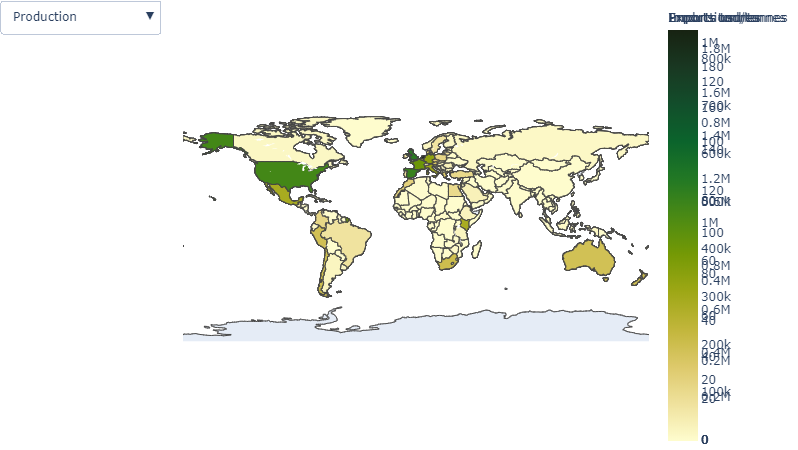

In [64]:
from PSLCOOLSS import production_price
production_price('Avocados', cs = 'speed')

 Slovenia, Spain, Sweden and the UK.

In [68]:
df_prod = pd.read_pickle("data/df_trade_merged.pkl")
df_prod.loc[df_prod['Importer'] == 'United Kingdom'].head(2)

,Importer,Exporter,Item,1993,1994,1995,1996,1997,1998,1999,...,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
330657,United Kingdom,Afghanistan,"Almonds, with shell",0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,1.0,1.0,1.0,0.0,2.0,0.0,2.0,2.0
330658,United Kingdom,Afghanistan,"Anise, badian, fennel, coriander",0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,5.0,0.0,0.0,5.0,0.0,0.0,0.0,0.0,0.0


#### Include Yasser's centrality to comment

## Quinoa

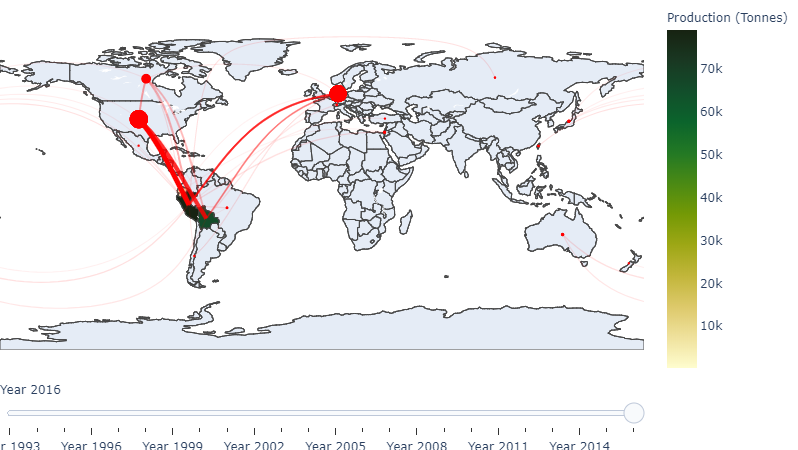

In [85]:
from GRANADASM import production_trade
# Set Europe to False if you want to see the EU countries individually
production_trade('Quinoa', Europe = True, cs = 'speed', thick = 12,  th_max = 250, th_min = 2, th_max2 = 120, th_min2 = 1, op_per = 0.95)

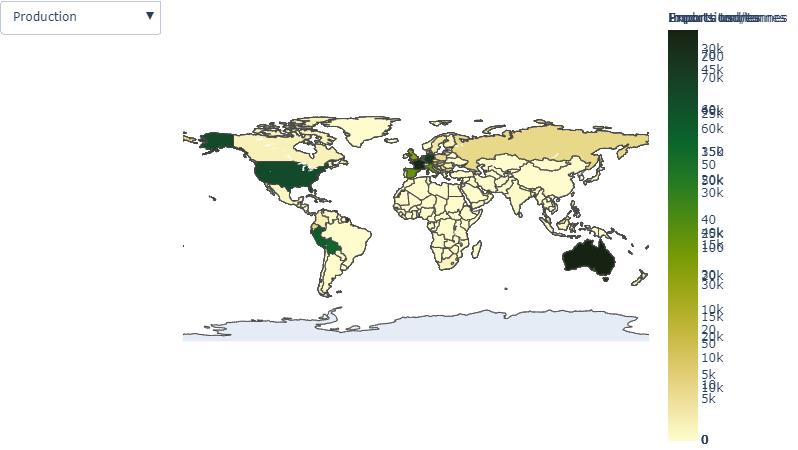

In [66]:
from PSLCOOLSS import production_price
production_price('Quinoa', cs = 'speed')

In [2]:
df_prod = pd.read_pickle("data/df_prod.pkl")
df_prod = df_prod.loc[df_prod['Element'] == 'Production']
df_prod = df_prod.loc[df_prod['Item'] == 'Quinoa']

df_trade = pd.read_pickle('data/df_trade_merged.pkl')
df_trade = df_trade.loc[df_trade['Item'] == 'Quinoa']

In [51]:
df_prod = pd.read_pickle("data/df_prod.pkl")
df_area = df_prod.loc[df_prod['Element'] == 'Area harvested']
df_area = df_area.loc[df_area['Area'] == 'Peru']

### Production of quinoa in Peru

In [30]:
prod_peru = df_prod.loc[df_prod['Area'] == 'Peru']

In [31]:
prod = prod_peru.iloc[:, 4:]
prod = prod.values[0]

In [32]:
prod

array([ 17157.,  16629.,  13773.,  16070.,  23688.,  28171.,  28413.,
        28191.,  22267.,  30373.,  30085.,  26997.,  32590.,  30429.,
        31824.,  29867.,  39397.,  41079.,  41182.,  44213.,  52129.,
       114725., 105666.,  79269.])

In [5]:
trade_peru = df_trade.loc[df_trade['Exporter'] == 'Peru']

In [21]:
years = ['1993', '1994', '1995', '1996', '1997', '1998', '1999', '2000', '2001', '2002', '2003', 
        '2004', '2005', '2006', '2007', '2008', '2009', '2010', '2011', '2012', '2013', '2014', 
        '2015', '2016']
sum_trade_peru = trade_peru[years].sum()
sum_exp = np.array(sum_trade_peru)
sum_exp

array([4.4000e+01, 4.9000e+01, 2.0000e+01, 1.8000e+02, 1.6600e+02,
       0.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00, 1.4000e+01,
       9.0000e+00, 3.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00,
       0.0000e+00, 1.6200e+02, 0.0000e+00, 0.0000e+00, 1.0748e+04,
       1.8698e+04, 3.6744e+04, 4.3873e+04, 4.9850e+04])

In [19]:
trade_peru_asimp = df_trade.loc[df_trade['Importer'] == 'Peru']
sum_trade_peru_imp = trade_peru_asimp[years].sum()
sum_imp = np.array(sum_trade_peru_imp)

In [20]:
sum_imp

array([117., 177., 563., 718., 382.,  21.,  80.,  40.,  95.,   0.,   0.,
        30.,   0., 112., 135.,  95.,  46.,  42.,   0.,  31.,  64., 476.,
       215.,  90.])

In [13]:
population = pd.read_csv("data/worldbank_pop_data.csv")

In [15]:
pop_peru = population.loc[population['Country Name'] == 'Peru']

In [33]:
pop_peru = pop_peru[years]
pop_peru = pop_peru.values[0]
pop_peru

array([23408131., 23851408., 24299160., 24753824., 25210954., 25658062.,
       26078293., 26459944., 26799285., 27100968., 27372226., 27624213.,
       27866145., 28102056., 28333052., 28562317., 28792655., 29027674.,
       29264318., 29506788., 29773987., 30090359., 30470734., 30926032.])

In [34]:
stay_in_peru = (sum_imp + prod) - sum_exp

In [36]:
tonnes_per_habitant = stay_in_peru/pop_peru

In [38]:
tonnes_per_habitant*100

array([0.0736069 , 0.07025581, 0.05891562, 0.06709266, 0.09481593,
       0.1098758 , 0.10925945, 0.10669335, 0.08343879, 0.11202183,
       0.1098778 , 0.09782722, 0.11694836, 0.10867888, 0.11279759,
       0.10490045, 0.13642715, 0.14166137, 0.14072428, 0.11351964,
       0.11249753, 0.260738  , 0.20350018, 0.095418  ])

In [42]:
import matplotlib.pyplot as plt

In [60]:
area_quinoa = df_area.loc[df_area['Item'] == 'Quinoa']
area_quinoa_np = area_quinoa.iloc[:,4:].values[0]

In [67]:
area_quinoa_np

array([17812., 20693., 18729., 18704., 27033., 30720., 28979., 28889.,
       25601., 27851., 28326., 27676., 28632., 29947., 30381., 31163.,
       34026., 35313., 35475., 38495., 44868., 68140., 69303., 64223.])

In [61]:
total_area = df_area.iloc[:,4:].sum()
total_area_np = np.array(total_area)

In [66]:
total_area_np

array([1406973., 1464560., 1584187., 1727937., 1798263., 1925292.,
       1987718., 2196585., 2117635., 2135298., 2142458., 2079323.,
       2171590., 2248345., 2288203., 2372421., 2448064., 2471180.,
       2436107., 2534192., 2672644., 2587863., 2657884., 2568675.])

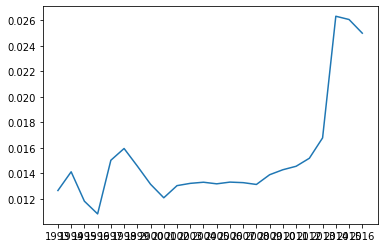

In [64]:
plt.plot(years, area_quinoa_np/total_area_np)

In [70]:
per_area = area_quinoa_np/total_area_np
per_area

array([0.0126598 , 0.01412916, 0.01182247, 0.01082447, 0.01503284,
       0.01595602, 0.01457903, 0.01315178, 0.01208943, 0.01304314,
       0.01322126, 0.0133101 , 0.01318481, 0.01331958, 0.01327723,
       0.01313553, 0.01389915, 0.01428993, 0.01456217, 0.01519025,
       0.01678787, 0.02633061, 0.0260745 , 0.02500238])

In [73]:
data = {'year': years, 'production': prod, 'exports': sum_exp, 'area': area_quinoa_np, 'per area': per_area}

In [75]:
df_peru = pd.DataFrame(data)
df_peru.head()

,year,production,exports,area,per area
0,1993,17157.0,44.0,17812.0,0.012660
1,1994,16629.0,49.0,20693.0,0.014129
2,1995,13773.0,20.0,18729.0,0.011822
3,1996,16070.0,180.0,18704.0,0.010824
4,1997,23688.0,166.0,27033.0,0.015033


In [76]:
df_peru.to_csv("Peru.csv")

In [100]:
trade_peru.head()

,Importer,Exporter,Item,1993,1994,1995,1996,1997,1998,1999,...,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
1363,Albania,Peru,Quinoa,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3079,Algeria,Peru,Quinoa,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5955,Argentina,Peru,Quinoa,3.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,20.0,0.0,20.0,111.0,238.0
7372,Armenia,Peru,Quinoa,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0
9591,Australia,Peru,Quinoa,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,447.0,1311.0,1746.0,1229.0,1278.0


In [78]:
trade_peru.to_csv("tradePeru")

In [99]:
main_importers = ['United States of America', 'Canada', 'Australia', 'Spain', 'Germany', 'United Kingdom', 'Israel', 'Netherlands', 'Italy', 'France']
inds = []
years2 = ['Importer', '2012', '2014', '2016']
[inds.append(ind) for ind in range(len(trade_peru)) if trade_peru.iloc[ind]['Importer'] in main_importers]
peru_importers = trade_peru.iloc[inds][years2]
peru_importers = peru_importers.sort_values(['2016'], ascending = False)

In [103]:
peru_importers.to_csv('peru_imp.csv')

In [112]:
peru_importers.head()

,Importer,2012,2014,2016
342962,United States of America,6943.0,18202.0,16178.0
213272,Netherlands,232.0,2168.0,4575.0
55452,Canada,592.0,3786.0,4241.0
335342,United Kingdom,202.0,1911.0,3512.0
157430,Italy,315.0,1313.0,3299.0


In [104]:
df_trade.head()

,Importer,Exporter,Item,1993,1994,1995,1996,1997,1998,1999,...,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
215,Afghanistan,Netherlands,Quinoa,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
847,Albania,France,Quinoa,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1005,Albania,Greece,Quinoa,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1208,Albania,Italy,Quinoa,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1363,Albania,Peru,Quinoa,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [108]:
df_trade.groupby(['Exporter']).sum().sort_values(['2016'], ascending = False)

,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,...,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
Exporter,,,,,,,,,,,,,,,,,,,,,
Peru,44.0,49.0,20.0,180.0,166.0,0.0,0.0,0.0,1.0,14.0,...,0.0,0.0,162.0,0.0,0.0,10748.0,18698.0,36744.0,43873.0,49850.0
Bolivia (Plurinational State of),538.0,1158.0,1492.0,1722.0,1797.0,1406.0,2038.0,1435.0,2123.0,2018.0,...,10455.0,10201.0,14424.0,15364.0,23151.0,27837.0,38131.0,33161.0,28466.0,26716.0
United States of America,0.0,0.0,0.0,53.0,95.0,68.0,93.0,86.0,52.0,122.0,...,0.0,0.0,0.0,0.0,7.0,3359.0,5446.0,12668.0,8396.0,5362.0
Netherlands,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1773.0,2343.0,1272.0,2592.0,3684.0
Canada,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,17.0,0.0,...,0.0,0.0,0.0,0.0,0.0,29.0,244.0,1396.0,3179.0,2214.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Norway,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Oman,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Pakistan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [111]:
df_trade.loc[df_trade['Exporter'] == 'Netherlands'].sort_values(['2016'], ascending = False).head(10)

,Importer,Exporter,Item,1993,1994,1995,1996,1997,1998,1999,...,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
13207,Austria,Netherlands,Quinoa,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,27.0,187.0,705.0
122877,Germany,Netherlands,Quinoa,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,262.0,519.0,223.0,405.0,484.0
111207,France,Netherlands,Quinoa,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,546.0,724.0,148.0,154.0,414.0
157163,Italy,Netherlands,Quinoa,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,137.0,140.0,124.0,227.0,345.0
31278,Belgium,Netherlands,Quinoa,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,445.0,363.0,237.0,416.0,323.0
334904,United Kingdom,Netherlands,Quinoa,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,236.0,269.0,232.0,223.0,251.0
90053,Denmark,Netherlands,Quinoa,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,8.0,31.0,47.0,219.0,208.0
296213,Spain,Netherlands,Quinoa,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,29.0,57.0,40.0,52.0,120.0
240712,Poland,Netherlands,Quinoa,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,8.0,28.0,22.0,65.0,117.0
303551,Sweden,Netherlands,Quinoa,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,4.0,10.0,33.0,99.0,93.0


In [113]:
705/4575

0.1540983606557377

## Plot

In [141]:
# 10 most relevant exporters in 2016
info_imp = df_trade.groupby(['Importer']).sum().reset_index()[['Importer', '2012', '2014', '2016']]
plot_imp = info_imp.sort_values(['2016'], ascending = False).iloc[:10]
# 10 most relevant exporter in 2016
info_exp = df_trade.groupby(['Exporter']).sum().reset_index()[['Exporter', '2012', '2014', '2016']]
plot_exp = info_exp.sort_values(['2016'], ascending = False).iloc[:10]

In [192]:
from GRANADA import correct_names
plot_exp = correct_names(plot_exp, 'Exporter', ['Bolivia', 'U.S.', 'U.K.'], ['Bolivia (Plurinational State of)', 'United States of America', 'United Kingdom'])
plot_imp = correct_names(plot_imp, 'Importer', ['Bolivia', 'U.S.', 'U.K.'], ['Bolivia (Plurinational State of)', 'United States of America', 'United Kingdom'])

In [193]:
import plotly.graph_objects as go
fig = go.Figure(data=[
    go.Bar(name='2012', x=plot_exp['Exporter'], y=plot_exp['2012'], marker_color = 'wheat'),
    go.Bar(name='2014', x=plot_exp['Exporter'], y=plot_exp['2014'], marker_color='lightsalmon'),
    go.Bar(name='2016', x=plot_exp['Exporter'], y=plot_exp['2016'], marker_color='indianred'),
    go.Bar(name='2012', x=plot_imp['Importer'], y=plot_imp['2012'], marker_color = 'wheat', visible = False),
    go.Bar(name='2014', x=plot_imp['Importer'], y=plot_imp['2014'], marker_color='lightsalmon', visible = False),
    go.Bar(name='2016', x=plot_imp['Importer'], y=plot_imp['2016'], marker_color='indianred', visible = False),
])

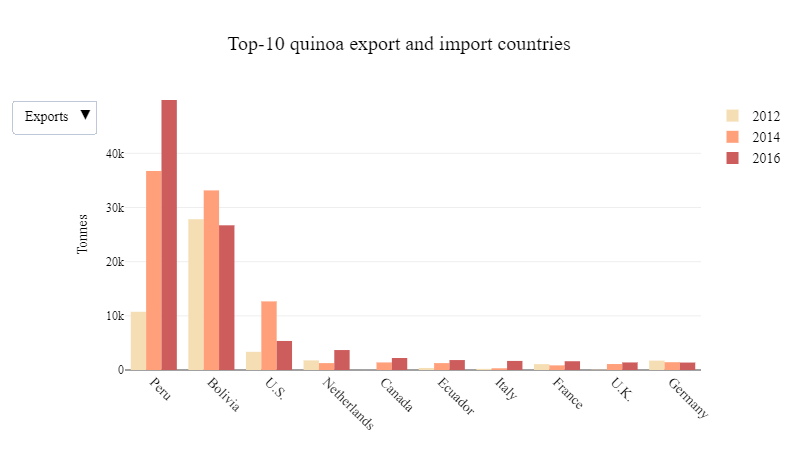

In [206]:
draft_template = go.layout.Template()
fig.update_yaxes(range=[0, plot_exp['2016'].max()])
fig.update_layout(
    updatemenus=[
        go.layout.Updatemenu(
            active=0,
            buttons=list([
                dict(label="Exports",
                     method="update",
                     args=[{"visible": [True, True, True, False, False, False]}]),
                dict(label="Imports",
                     method="update",
                     args=[{"visible": [False, False, False, True, True, True]}]),
            ]),
        )
    ],
    template=draft_template,
    yaxis=dict(
        title='Tonnes',
        titlefont_size=14,
        tickfont_size=12,
    ),
    title = 'Top-10 quinoa export and import countries',
    font=dict(
        family="source-serif-pro",
        size=14,
        color = 'rgb(0,0,0)'
    ),
   
    #paper_bgcolor='rgba(0,0,0,0)',
)
fig.update_layout(barmode='group', xaxis_tickangle=45)
